<a href="https://colab.research.google.com/github/ALRIER/Timeseries-Machine-Learning/blob/Final_prototype/FinalVersion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Amazon y Apple stock analysis by Alvaro Rivera-Eraso. 

1. Call packages. 
2. Call API + download data. 
3. Analyse data, decribes, heads, columns. 
4. Plot open vs close prices. 
5. Resample data.
6. Check autocorrelation between stocks. 
7. Shift data and check lags in each stock. 
8. Organize 1 dataframe with all data to ckeck differences between lags in stocks. 

Ok, so first Im going to install and request al packages I sill need today. 

In [183]:
!pip install yfinance
!pip install pandas_datareader
!pip install auto-sklearn
!pip install PipelineProfiler
!pip install Cython numpy
!pip apt-get install swig -y


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: unknown command "apt-get"


In [184]:
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import warnings
import pandas_profiling
import PipelineProfiler
import yfinance as yf
from scipy.stats import chi2_contingency
from matplotlib import style
from scipy import stats
from pandas_profiling import ProfileReport
from pandas_datareader import data as pdr
#from google.colab import drive
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score
from autosklearn.classification import AutoSklearnClassifier
from autosklearn.experimental.askl2 import AutoSklearn2Classifier
%matplotlib inline
plt.style.use('ggplot')
warnings.filterwarnings('ignore')   
#drive.mount('/content/drive')

In [185]:
#Now I will ask for my stock
AAPL1 = yf.Ticker("AAPL") 
period_asset = "10y"
# get historical market data
AAPL1 = AAPL1.history(period=period_asset)
AAPL=AAPL1.copy()

In [186]:
#Now I will ask for my stock
AMZN1 = yf.Ticker("AMZN") 
period_asset = "10y"
# get historical market data
AMZN1 = AMZN1.history(period=period_asset)
AMZN=AMZN1.copy()

Great, now I have the Apple's and AMZN's stock for the last 10 years, now Im going to check it to see how I can engeneering the data to transform it and create my model.  

In [187]:
AMZN.info()
AAPL.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2517 entries, 2013-01-22 00:00:00-05:00 to 2023-01-19 00:00:00-05:00
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          2517 non-null   float64
 1   High          2517 non-null   float64
 2   Low           2517 non-null   float64
 3   Close         2517 non-null   float64
 4   Volume        2517 non-null   int64  
 5   Dividends     2517 non-null   float64
 6   Stock Splits  2517 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 221.9 KB
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2517 entries, 2013-01-22 00:00:00-05:00 to 2023-01-19 00:00:00-05:00
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          2517 non-null   float64
 1   High          2517 non-null   float64
 2   Low           2517 non-null   float64
 3   Close         2517 non-null   flo

In [188]:
AMZN.columns
AAPL.columns

Index(['Open', 'High', 'Low', 'Close', 'Volume', 'Dividends', 'Stock Splits'], dtype='object')

In [189]:
AMZN1.shape
AAPL1.shape

(2517, 7)

Here Im taking a look to each stock to understand how it behaves. The open vs the clos price for each year. 

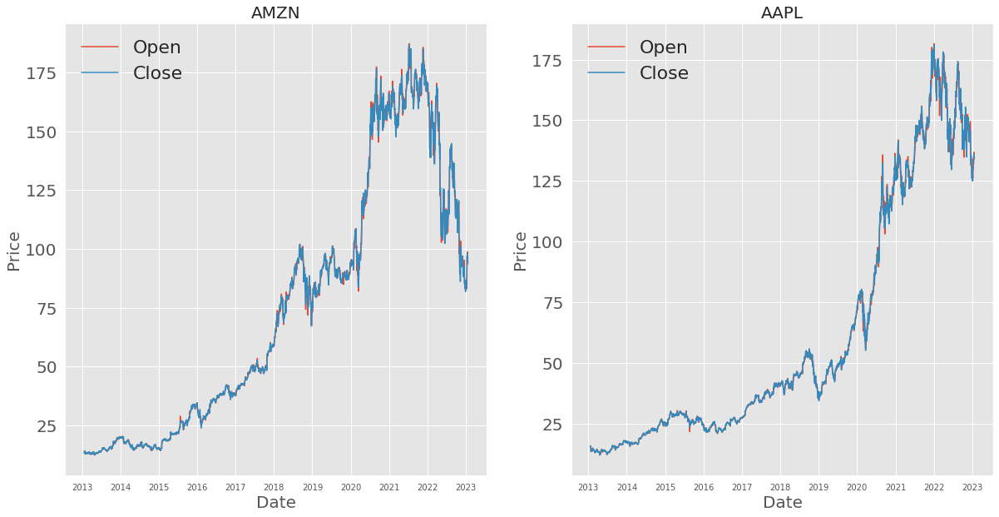

In [190]:
plt.figure(figsize = (20,10)) # Adjusting figure size
plt.subplot(1,2,1) 
plt.title('AMZN',fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 20)
plt.xlabel('Date',fontsize = 20)
plt.ylabel('Price',fontsize = 20)
plt.plot(AMZN['Open'],label = 'Open')
plt.plot(AMZN['Close'],label = 'Close') 
plt.legend(loc='upper left', frameon=False,framealpha=1,prop={'size': 22}) # Properties of legend box

plt.subplot(1,2,2) 
plt.title('AAPL',fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 20)
plt.xlabel('Date',fontsize = 20)
plt.ylabel('Price',fontsize = 20)
plt.plot(AAPL['Open'],label = 'Open')
plt.plot(AAPL['Close'],label = 'Close') 
plt.legend(loc='upper left', frameon=False,framealpha=1,prop={'size': 22}) # Properties of legend box

I allready saw the normal behavior of the stock so I want to reample it to the business month to understan better each stock.

In [191]:
#Here i will resample the data for each business month period.
RsampAMZN=AMZN.resample('BM').last().copy()
RsampAMZN=pd.DataFrame(RsampAMZN) 
RsampAMZN.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2013-01-31 00:00:00-05:00,13.5520,13.7970,13.1850,13.2750,135442000,0.0,0.0
2013-02-28 00:00:00-05:00,13.0905,13.3500,13.0315,13.2135,53344000,0.0,0.0
2013-03-29 00:00:00-04:00,13.2910,13.3690,13.2030,13.3245,49474000,0.0,0.0
2013-04-30 00:00:00-04:00,12.4685,12.7340,12.4280,12.6905,84976000,0.0,0.0
2013-05-31 00:00:00-04:00,13.3000,13.5955,13.2970,13.4600,67486000,0.0,0.0


In [192]:
#Here i will resample the data for each business month period.
RsampAAPL=AAPL.resample('BM').last().copy()
RsampAAPL=pd.DataFrame(RsampAAPL) 
RsampAAPL.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2013-01-31 00:00:00-05:00,14.035613,14.106254,13.974186,13.989849,319334400,0.0,0.0
2013-02-28 00:00:00-05:00,13.717971,13.835982,13.636106,13.636106,322515200,0.0,0.0
2013-03-29 00:00:00-04:00,13.896224,13.958009,13.642902,13.675031,442839600,0.0,0.0
2013-04-30 00:00:00-04:00,13.441479,13.755042,13.347874,13.678736,691538400,0.0,0.0
2013-05-31 00:00:00-04:00,14.071545,14.214594,13.978254,13.985407,384302800,0.0,0.0


In [193]:
sns.set()

Text(0.5, 1.0, 'AAPL')

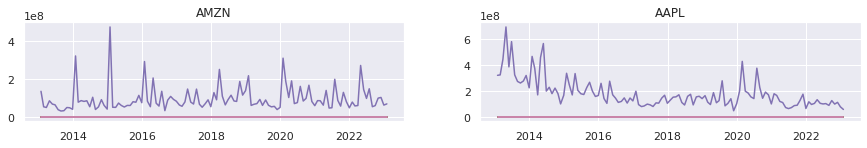

In [194]:
#Plotting my figures
plt.figure(figsize=(15,4))
plt.subplot(221)
plt.plot(RsampAMZN)
plt.title("AMZN")

plt.subplot(222)
plt.plot(RsampAAPL)
plt.title("AAPL")


Well, this is the behavior of the stock based on the business month so i will take a look if there is or not any stationary behavior in the stocks, so i will see the white noice graphics to understand it. 

Text(0.5, 1.0, 'AAPL Autocorrelation')

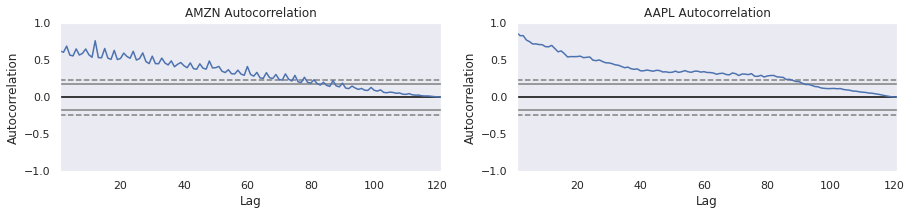

In [195]:
#Plotting my autocorrelation plots. 
from pandas.plotting import autocorrelation_plot
ax=plt.figure(figsize=(15,6))
plt.subplot(221)
autocorrelation_plot(RsampAMZN)
plt.title("AMZN Autocorrelation")

plt.subplot(222)
autocorrelation_plot(RsampAAPL)
plt.title("AAPL Autocorrelation")

Taking a look at the autocorrelation plot It's possible to see some little autocorrelation patterns in the stock, but the pattern disappears at some point. Based on that I want to take a look at the stock with 1 lag, to understand the behavior of the stock lagged. 

In [196]:
#Now Im using Shift to create the lag 1 and make the difference between observations. 
RsampAMZN1= RsampAMZN.shift(1)
RsampAMZN1=pd.DataFrame(RsampAMZN1)
newAMZN = RsampAMZN.subtract(RsampAMZN1)
newAMZN=pd.DataFrame(newAMZN)
newAMZN.head()


,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2013-01-31 00:00:00-05:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-02-28 00:00:00-05:00,-0.4615,-0.4470,-0.153501,-0.0615,-82098000.0,0.0,0.0
2013-03-29 00:00:00-04:00,0.2005,0.0190,0.171500,0.1110,-3870000.0,0.0,0.0
2013-04-30 00:00:00-04:00,-0.8225,-0.6350,-0.775000,-0.6340,35502000.0,0.0,0.0
2013-05-31 00:00:00-04:00,0.8315,0.8615,0.868999,0.7695,-17490000.0,0.0,0.0


In [197]:
RsampAAPL1= RsampAAPL.shift(1)
RsampAAPL1=pd.DataFrame(RsampAAPL1)
newAAPL = RsampAAPL.subtract(RsampAAPL1)
newAAPL=pd.DataFrame(newAAPL)
newAAPL.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2013-01-31 00:00:00-05:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-02-28 00:00:00-05:00,-0.317642,-0.270273,-0.338080,-0.353744,3180800.0,0.0,0.0
2013-03-29 00:00:00-04:00,0.178252,0.122028,0.006797,0.038925,120324400.0,0.0,0.0
2013-04-30 00:00:00-04:00,-0.454745,-0.202968,-0.295029,0.003705,248698800.0,0.0,0.0
2013-05-31 00:00:00-04:00,0.630066,0.459553,0.630380,0.306671,-307235600.0,0.0,0.0


Text(0.5, 1.0, 'newAAPL')

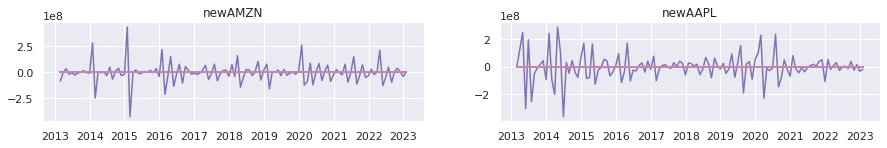

In [198]:
#the graphic for each return in each stock
plt.figure(figsize=(15,4))
plt.subplot(221)
plt.plot(newAMZN)
plt.title("newAMZN")

plt.subplot(222)
plt.plot(newAAPL)
plt.title("newAAPL")

Well, now I have the lag behavior and I can clearly see the stationary tendency in the stock for each year and the points in which the tendency has been broken down. 

Clearly, I see the tendency is more stationary in the past 3 to 4 years for each stock so I would like to see how good a machine learning model can predict the close price for each one or for one of them.

In [199]:
#Merge dataframes and rename
NewStock=pd.concat([RsampAMZN,RsampAAPL])
NewStock.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2013-01-31 00:00:00-05:00,13.5520,13.7970,13.1850,13.2750,135442000,0.0,0.0
2013-02-28 00:00:00-05:00,13.0905,13.3500,13.0315,13.2135,53344000,0.0,0.0
2013-03-29 00:00:00-04:00,13.2910,13.3690,13.2030,13.3245,49474000,0.0,0.0
2013-04-30 00:00:00-04:00,12.4685,12.7340,12.4280,12.6905,84976000,0.0,0.0
2013-05-31 00:00:00-04:00,13.3000,13.5955,13.2970,13.4600,67486000,0.0,0.0


In [200]:
NewStock1=pd.concat([newAAPL,newAMZN])
NewStock1

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2013-01-31 00:00:00-05:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2013-02-28 00:00:00-05:00,-0.317642,-0.270273,-0.338080,-0.353744,3180800.0,0.0,0.0
2013-03-29 00:00:00-04:00,0.178252,0.122028,0.006797,0.038925,120324400.0,0.0,0.0
2013-04-30 00:00:00-04:00,-0.454745,-0.202968,-0.295029,0.003705,248698800.0,0.0,0.0
2013-05-31 00:00:00-04:00,0.630066,0.459553,0.630380,0.306671,-307235600.0,0.0,0.0
...,...,...,...,...,...,...,...
2022-09-30 00:00:00-04:00,-15.369995,-13.669998,-13.900002,-13.769997,5830900.0,0.0,0.0
2022-10-31 00:00:00-04:00,-10.520004,-12.049995,-12.099998,-10.559998,39771800.0,0.0,0.0
2022-11-30 00:00:00-05:00,-11.089996,-8.330002,-9.209999,-5.900002,3554400.0,0.0,0.0


This is just an experiment jeje, don't pay attention, I just wanted to compare the price after and before the lags to see the tendency I just saw in the past plot.

However, it seems that concat the stocks doesn't show any clear tendency, or at least is my humble opinion. (me and my experiments) 

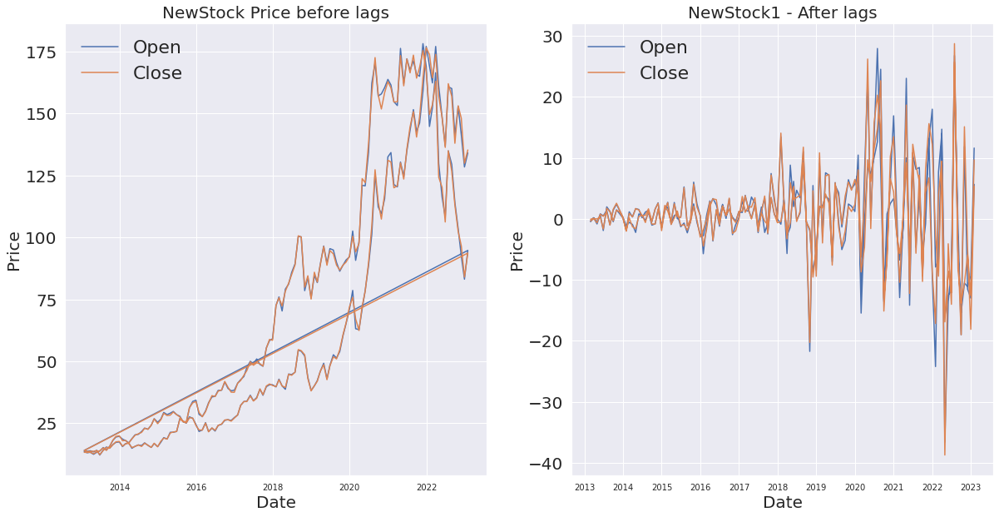

In [201]:
plt.figure(figsize = (20,10)) # Adjusting figure size
plt.subplot(1,2,1) 
plt.title('NewStock Price before lags',fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 20)
plt.xlabel('Date',fontsize = 20)
plt.ylabel('Price',fontsize = 20)
plt.plot(NewStock['Open'],label = 'Open')
plt.plot(NewStock['Close'],label = 'Close') 
plt.legend(loc='upper left', frameon=False,framealpha=1,prop={'size': 22})

plt.subplot(1,2,2) 
plt.title('NewStock1 - After lags',fontsize = 20)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 20)
plt.xlabel('Date',fontsize = 20)
plt.ylabel('Price',fontsize = 20)
plt.plot(NewStock1['Open'],label = 'Open')
plt.plot(NewStock1['Close'],label = 'Close') 
plt.legend(loc='upper left', frameon=False,framealpha=1,prop={'size': 22})

Well, I gonna start with the AMZN stock since it seemed to be the most stationary and the most autocorrelated one. 

In [202]:
AMZN.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517.0,2517.000000
mean,74.216551,75.063213,73.266915,74.173995,8.036254e+07,0.0,0.007946
std,53.191011,53.843556,52.461006,53.135574,4.226577e+07,0.0,0.398647
min,12.447000,12.646500,12.287500,12.411500,1.762600e+07,0.0,0.000000
25%,24.201000,24.472000,23.760500,24.108999,5.374200e+07,0.0,0.000000
50%,65.612000,66.372498,64.614998,65.260002,6.887200e+07,0.0,0.000000
75%,107.970001,110.155998,106.294502,107.783501,9.300200e+07,0.0,0.000000
max,187.199997,188.654007,184.839493,186.570496,4.771220e+08,0.0,20.000000


In [203]:
AMZN=AMZN.drop(columns=['Dividends','Stock Splits','Volume'])

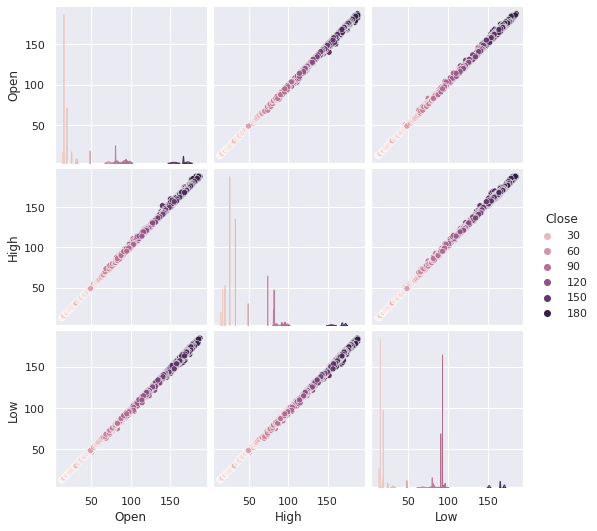

In [204]:
sns.pairplot(data=AMZN, hue="Close")

In [205]:
#Ckequind my data to see if averything is ok. 
from scipy.special import xlogy
X = AMZN[['Open','High','Low']].copy()
y = AMZN['Close'].copy()
X


,Open,High,Low
Date,,,
2013-01-22 00:00:00-05:00,13.581000,13.605000,13.461500
2013-01-23 00:00:00-05:00,13.528500,13.554500,13.332500
2013-01-24 00:00:00-05:00,13.468500,13.832500,13.468500
2013-01-25 00:00:00-05:00,13.750000,14.236000,13.720000
2013-01-28 00:00:00-05:00,14.189000,14.224000,13.720000
...,...,...,...
2023-01-12 00:00:00-05:00,96.930000,97.190002,93.500000
2023-01-13 00:00:00-05:00,94.180000,98.370003,94.120003
2023-01-17 00:00:00-05:00,98.680000,98.889999,95.730003


In [206]:
X.describe()

,Open,High,Low
count,2517.000000,2517.000000,2517.000000
mean,74.216551,75.063213,73.266915
std,53.191011,53.843556,52.461006
min,12.447000,12.646500,12.287500
25%,24.201000,24.472000,23.760500
50%,65.612000,66.372498,64.614998
75%,107.970001,110.155998,106.294502
max,187.199997,188.654007,184.839493


In [207]:
#Checking y... everything is ok. 
y

Date
2013-01-22 00:00:00-05:00    13.509500
2013-01-23 00:00:00-05:00    13.405500
2013-01-24 00:00:00-05:00    13.673000
2013-01-25 00:00:00-05:00    14.199500
2013-01-28 00:00:00-05:00    13.802000
                               ...    
2023-01-12 00:00:00-05:00    95.269997
2023-01-13 00:00:00-05:00    98.120003
2023-01-17 00:00:00-05:00    96.050003
2023-01-18 00:00:00-05:00    95.459999
2023-01-19 00:00:00-05:00    93.680000
Name: Close, Length: 2517, dtype: float64

In [208]:
#Checking the sahes are ok.
print(X.shape)
print(y.shape)

(2517, 3)
(2517,)


In [209]:
#Split process qith my data, i will use the 0.2 rule. 
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(2013, 3)
(504, 3)
(2013,)
(504,)


In [210]:
%%time
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor(n_estimators=100, n_jobs=-1)
r_fit = rf_reg.fit(X_train, y_train)

CPU times: user 759 ms, sys: 14.7 ms, total: 774 ms
Wall time: 743 ms


In [211]:
y_pred = r_fit.predict(X_test) #make predictions for the test set
print(y_pred.shape)
y_pred #these are the predictions made by the model

(504,)


array([157.23920471,  15.33710497,  16.25469522,  18.47071489,
        26.53730492,  14.52278489,  13.41525508,  45.09681984,
        16.3004701 , 174.38934998,  41.56520496,  18.81014   ,
        14.94586489,  18.89341505, 173.64906967,  73.12365921,
        13.33922499,  21.20414032, 171.78078659, 172.91088394,
        14.28930492,  26.40358498,  41.54379494,  14.39355981,
        14.89810507,  90.27061546, 114.00964066,  16.34357492,
        81.64619331, 118.29966972,  18.72802008,  21.92596483,
        38.93289459,  75.32950653,  16.6104999 ,  35.67058414,
       164.60248505,  89.17056038,  15.90610978, 155.81398758,
        38.14271469, 100.37284668,  16.33503513,  93.02291107,
        17.2021599 , 155.22301163,  19.20502525,  15.29990489,
        93.17480438,  94.38814468,  97.92031509,  33.49872925,
        13.41642994, 127.6669342 ,  82.06032074, 145.92991394,
        83.69128418,  42.76915459,  14.67362511,  15.55281998,
       168.73378174, 171.90344116, 174.51019653,  13.37

In [212]:
y_test

Date
2021-01-14 00:00:00-05:00    156.373505
2013-07-17 00:00:00-04:00     15.434500
2014-09-22 00:00:00-04:00     16.225000
2014-03-10 00:00:00-04:00     18.526501
2015-07-30 00:00:00-04:00     26.837999
                                ...    
2020-05-20 00:00:00-04:00    124.897003
2021-08-09 00:00:00-04:00    167.093506
2021-04-01 00:00:00-04:00    158.050003
2017-05-25 00:00:00-04:00     49.668999
2017-04-04 00:00:00-04:00     45.341499
Name: Close, Length: 504, dtype: float64

In [213]:
# evaluate the predictions with some metrics
from sklearn.metrics import mean_squared_error, r2_score
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred))) #RMSE: root mean square error
print("R²:", r2_score(y_test, y_pred))

RMSE: 0.8968281792030272
R²: 0.9997296840546985


In [214]:
from sklearn import svm
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10000)

In [215]:
from sklearn.model_selection import cross_val_score
scores = cross_val_score(r_fit, X, y, cv=100)
scores

array([0.73298448, 0.92429352, 0.85071532, 0.89608958, 0.97259445,
       0.92321243, 0.93428715, 0.98781917, 0.95066703, 0.85719419,
       0.91968227, 0.97416003, 0.94349194, 0.93501858, 0.9830888 ,
       0.96079101, 0.91377653, 0.98494606, 0.96087719, 0.98848724,
       0.84413719, 0.85373398, 0.91779267, 0.72657807, 0.97412636,
       0.86045312, 0.88059333, 0.96414059, 0.64310419, 0.93447985,
       0.96287341, 0.95777962, 0.97548846, 0.6758311 , 0.85872723,
       0.70176958, 0.96743549, 0.96270191, 0.86039827, 0.97288223,
       0.96123113, 0.88862715, 0.944361  , 0.78312   , 0.75397435,
       0.91452174, 0.94441104, 0.96957832, 0.70169316, 0.87715365,
       0.87807665, 0.94142492, 0.93438249, 0.97809141, 0.94568612,
       0.97645264, 0.87964072, 0.93070975, 0.89284155, 0.94433027,
       0.8413871 , 0.97243581, 0.8868278 , 0.9829327 , 0.9465815 ,
       0.84648433, 0.956613  , 0.6885039 , 0.88336821, 0.88197304,
       0.94723635, 0.8868829 , 0.88624376, 0.93366827, 0.93587

In [216]:
 print("%0.2f accuracy with a standard deviation of %0.2f" % (scores.mean(), scores.std()))

0.91 accuracy with a standard deviation of 0.08


In [231]:
from pprint import pprint

import sklearn.datasets
import sklearn.metrics

import autosklearn.regression
import matplotlib.pyplot as plt

In [236]:
automl = autosklearn.regression.AutoSklearnRegressor(
    time_left_for_this_task=120,
    per_run_time_limit=30)
automl.fit(X_train, y_train, dataset_name="AMZN")

AutoSklearnRegressor(ensemble_class=<class 'autosklearn.ensembles.ensemble_selection.EnsembleSelection'>,
                     per_run_time_limit=30, time_left_for_this_task=120)

In [238]:
print(automl.leaderboard())

          rank  ensemble_weight            type      cost  duration
model_id                                                           
3            1              1.0  ard_regression  0.000157  0.958429


In [239]:
train_predictions = automl.predict(X_train)
print("Train R2 score:", sklearn.metrics.r2_score(y_train, train_predictions))
test_predictions = automl.predict(X_test)
print("Test R2 score:", sklearn.metrics.r2_score(y_test, test_predictions))

Train R2 score: 0.9998464263557519
Test R2 score: 0.9998225399766618


In [240]:
profiler_data= PipelineProfiler.import_autosklearn(automl)
PipelineProfiler.plot_pipeline_matrix(profiler_data)

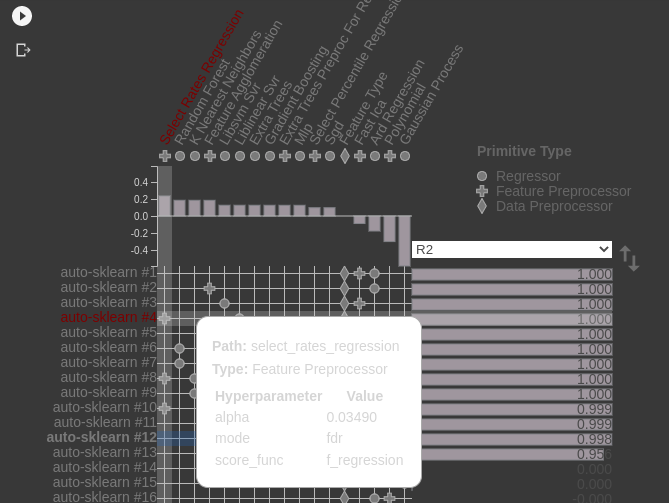

#  Ahora APPL

In [217]:
AAPL.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,2517.000000,2517.000000,2517.000000,2517.000000,2.517000e+03,2517.000000,2517.000000
mean,61.171018,61.867323,60.494014,61.204820,1.689806e+08,0.002626,0.004370
std,49.365436,50.012725,48.726372,49.392093,1.219044e+08,0.021325,0.160672
min,11.985501,12.344785,11.896837,12.064587,3.519590e+07,0.000000,0.000000
25%,24.946877,25.138891,24.584907,24.857615,9.126650e+07,0.000000,0.000000
50%,39.922076,40.460784,39.487173,39.950245,1.297568e+08,0.000000,0.000000
75%,94.938533,95.657328,93.252303,94.714531,2.025632e+08,0.000000,0.000000
max,181.576172,181.884380,178.086416,180.959732,1.460852e+09,0.230000,7.000000


In [218]:
AAPL=AAPL.drop(columns=['Dividends','Stock Splits','Volume'])

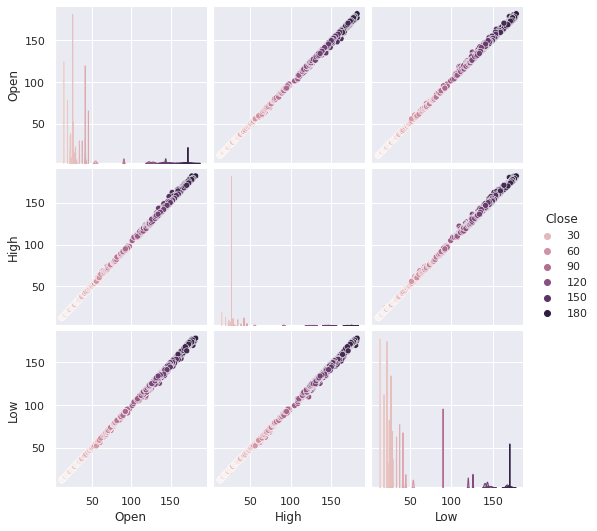

In [219]:
sns.pairplot(data=AAPL, hue="Close")

In [220]:
#Ckequind my data to see if averything is ok. 
from scipy.special import xlogy
XAAPL = AMZN[['Open','High','Low']].copy()
yAAPL = AMZN['Close'].copy()
XAAPL


,Open,High,Low
Date,,,
2013-01-22 00:00:00-05:00,13.581000,13.605000,13.461500
2013-01-23 00:00:00-05:00,13.528500,13.554500,13.332500
2013-01-24 00:00:00-05:00,13.468500,13.832500,13.468500
2013-01-25 00:00:00-05:00,13.750000,14.236000,13.720000
2013-01-28 00:00:00-05:00,14.189000,14.224000,13.720000
...,...,...,...
2023-01-12 00:00:00-05:00,96.930000,97.190002,93.500000
2023-01-13 00:00:00-05:00,94.180000,98.370003,94.120003
2023-01-17 00:00:00-05:00,98.680000,98.889999,95.730003


In [221]:
XAAPL.describe()

,Open,High,Low
count,2517.000000,2517.000000,2517.000000
mean,74.216551,75.063213,73.266915
std,53.191011,53.843556,52.461006
min,12.447000,12.646500,12.287500
25%,24.201000,24.472000,23.760500
50%,65.612000,66.372498,64.614998
75%,107.970001,110.155998,106.294502
max,187.199997,188.654007,184.839493


In [222]:
#Checking y... everything is ok. 
yAAPL

Date
2013-01-22 00:00:00-05:00    13.509500
2013-01-23 00:00:00-05:00    13.405500
2013-01-24 00:00:00-05:00    13.673000
2013-01-25 00:00:00-05:00    14.199500
2013-01-28 00:00:00-05:00    13.802000
                               ...    
2023-01-12 00:00:00-05:00    95.269997
2023-01-13 00:00:00-05:00    98.120003
2023-01-17 00:00:00-05:00    96.050003
2023-01-18 00:00:00-05:00    95.459999
2023-01-19 00:00:00-05:00    93.680000
Name: Close, Length: 2517, dtype: float64

In [223]:
#Checking the sahes are ok.
print(XAAPL.shape)
print(yAAPL.shape)

(2517, 3)
(2517,)


In [224]:
#Split process qith my data, i will use the 0.2 rule. 
from sklearn.model_selection import train_test_split

XAAPL_train, XAAPL_test, yAAPL_train, yAAPL_test = train_test_split(XAAPL, yAAPL, test_size=0.2)

print(XAAPL_train.shape)
print(XAAPL_test.shape)
print(yAAPL_train.shape)
print(yAAPL_test.shape)

(2013, 3)
(504, 3)
(2013,)
(504,)


In [225]:
%%time
from sklearn.ensemble import RandomForestRegressor

AAPLrf_reg = RandomForestRegressor(n_estimators=100, n_jobs=-1)
AAPLr_fit = rf_reg.fit(X_train, y_train)

CPU times: user 738 ms, sys: 25.2 ms, total: 763 ms
Wall time: 470 ms


In [226]:
yAAPL_pred = AAPLr_fit.predict(X_test) #make predictions for the test set
print(yAAPL_pred.shape)
 #these are the predictions made by the model

(504,)


In [227]:
yAAPL_test

Date
2018-03-09 00:00:00-05:00     78.944504
2023-01-18 00:00:00-05:00     95.459999
2020-06-26 00:00:00-04:00    134.643494
2017-09-28 00:00:00-04:00     47.820000
2020-05-21 00:00:00-04:00    122.336998
                                ...    
2015-11-19 00:00:00-05:00     33.063499
2013-06-27 00:00:00-04:00     13.877500
2020-02-25 00:00:00-05:00     98.637001
2018-02-07 00:00:00-05:00     70.838997
2021-12-09 00:00:00-05:00    174.171005
Name: Close, Length: 504, dtype: float64

In [228]:
# evaluate the predictions with some metrics
from sklearn.metrics import mean_squared_error, r2_score
print("RMSE:", np.sqrt(mean_squared_error(yAAPL_test, yAAPL_pred))) #RMSE: root mean square error
print("R²:", r2_score(yAAPL_test, yAAPL_pred))

RMSE: 73.1177113480453
R²: -0.9210702381587703


In [229]:
from sklearn import svm
XAAPL_train, XAAPL_test, yAAPL_train, yAAPL_test = train_test_split(XAAPL, yAAPL, test_size=0.2, random_state=10000)

In [234]:
from sklearn.model_selection import cross_val_score
scoresAAPL = cross_val_score(AAPLr_fit, XAAPL, yAAPL, cv=100)
scoresAAPL

array([0.73494908, 0.92414632, 0.84886701, 0.89079269, 0.9695031 ,
       0.9202769 , 0.93208141, 0.98735526, 0.95132106, 0.85898777,
       0.9217847 , 0.97281897, 0.94127211, 0.93100328, 0.9818636 ,
       0.96422812, 0.92294695, 0.98466043, 0.96101498, 0.98854817,
       0.84846474, 0.86533283, 0.91670892, 0.73093827, 0.97354768,
       0.85832266, 0.89406874, 0.9678455 , 0.66283952, 0.93728152,
       0.96142291, 0.95556454, 0.97506591, 0.67641321, 0.861481  ,
       0.72978485, 0.96864501, 0.9630467 , 0.86162755, 0.96871824,
       0.96223591, 0.88860085, 0.94332827, 0.79840507, 0.77500588,
       0.91567478, 0.94499458, 0.96937236, 0.69569947, 0.89817135,
       0.8742826 , 0.94565623, 0.92979566, 0.9754596 , 0.94517251,
       0.97520265, 0.87603884, 0.93063143, 0.88970132, 0.94313554,
       0.83295647, 0.96864936, 0.8858521 , 0.98386078, 0.94459884,
       0.84970617, 0.96107982, 0.68162071, 0.8671905 , 0.87128043,
       0.94522106, 0.89472785, 0.89409633, 0.93259221, 0.93330

In [235]:
print("%0.2f accuracy with a standard deviation of %0.2f" % (scoresAAPL.mean(), scores.std()))

0.91 accuracy with a standard deviation of 0.08


In [241]:
automlAAPL = autosklearn.regression.AutoSklearnRegressor(
    time_left_for_this_task=120,
    per_run_time_limit=30)
automlAAPL.fit(XAAPL_train, yAAPL_train, dataset_name="AAPL")

AutoSklearnRegressor(ensemble_class=<class 'autosklearn.ensembles.ensemble_selection.EnsembleSelection'>,
                     per_run_time_limit=30, time_left_for_this_task=120)

In [242]:
print(automlAAPL.leaderboard())

          rank  ensemble_weight            type      cost  duration
model_id                                                           
3            1              1.0  ard_regression  0.000157  2.491069


In [243]:
train_predictions = automlAAPL.predict(XAAPL_train)
print("Train R2 score:", sklearn.metrics.r2_score(yAAPL_train, train_predictions))
test_predictions = automlAAPL.predict(XAAPL_test)
print("Test R2 score:", sklearn.metrics.r2_score(yAAPL_test, test_predictions))

Train R2 score: 0.9998464263557519
Test R2 score: 0.9998225399766618


In [244]:
profiler_dataAAPL= PipelineProfiler.import_autosklearn(automlAAPL)
PipelineProfiler.plot_pipeline_matrix(profiler_dataAAPL)

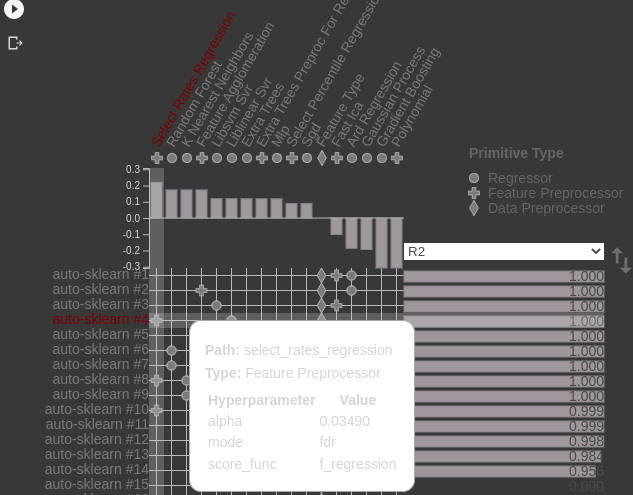